# Detection and Comparation of Sources in the images obtained with the PhoSim Simulator

### By Sergio Daniel Hernandez Charpak

## Detection of Sources on the simulated images using the sep library

Importing the libraries

In [3]:
%pylab inline
import sep #http://sep.readthedocs.org/
import os 
from astropy.io import fits
import glob

Populating the interactive namespace from numpy and matplotlib


We now define the path were the image is. The images are saved in the folder calexp (Calibrated Exposure) folder as they already went through some process to be able to be visualized. Between other properties, the w13_diffim_v11 represent the instrument simulated and the R22 represents the filter used.

In [19]:
path_images = '../../PruebaImagenes/w13_diffim_v11/calexp/v6866601-fi/R22/S20.fits'

As it is a .fits file, we open it and ask to see its information.

In [20]:
pha_list = fits.open(path_images)
pha_list.info()

Filename: ../../PruebaImagenes/w13_diffim_v11/calexp/v6866601-fi/R22/S20.fits
No.    Name         Type      Cards   Dimensions   Format
0    PRIMARY     PrimaryHDU     347   ()              
1                ImageHDU        33   (4000, 4072)   float32   
2                ImageHDU        44   (4000, 4072)   int16   
3                ImageHDU        33   (4000, 4072)   float32   
4                BinTableHDU     40   16R x 7C     [1J, 1J, 1J, 1J, 1J, 64A, 64A]   
5                BinTableHDU     20   4R x 2C      [64A, 1J]   
6                BinTableHDU     41   2R x 6C      [1J, 1J, 1J, 1J, 1J, 9D]   
7                BinTableHDU     41   2R x 6C      [1J, 1J, 1J, 1J, 1J, 1D]   
8                BinTableHDU     26   1R x 3C      [1J, 1D, 1D]   
9                BinTableHDU     40   1R x 6C      [1J, 1J, 1J, 1J, 4J, 4J]   
10               BinTableHDU     39   4R x 5C      [6D, 1D, 1D, 1D, 1D]   
11               BinTableHDU     39   4R x 5C      [1J, 1J, 1J, 1J, 625D]   
12            

We can now ask the data from every element of the list. We will now work with the first imageHDU of the list. The BinTableHDU represent diferent data of the images. There is a lot of information available in these tables.

In [6]:
pha_data_1 = pha_list[1].data
print shape(pha_data_1)

(4072, 4000)


With the data loaded and its shape verified we can now visualized this image.

<matplotlib.colorbar.Colorbar instance at 0x7fe2e9c089e0>

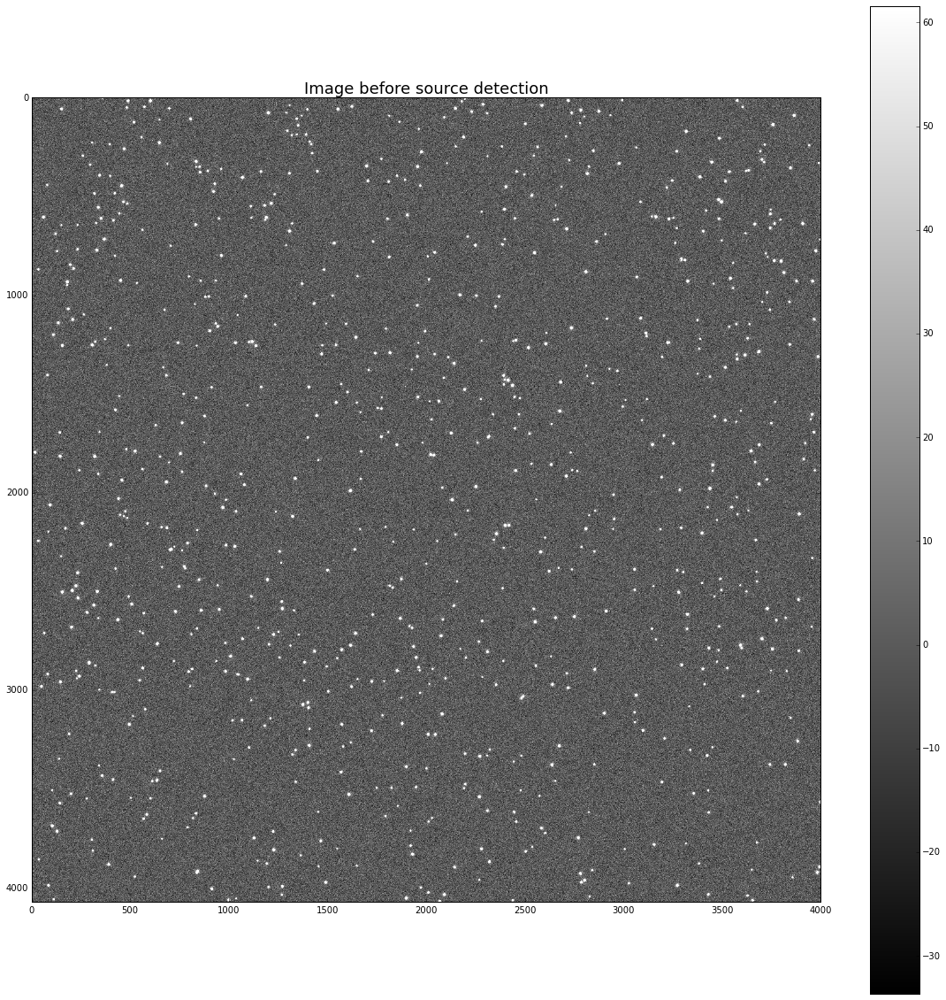

In [7]:
figure(figsize = (20,20))
imshow(pha_data_1, cmap='gray', vmin=-33.627594,vmax=61.58709)
title("Image before source detection", fontsize=18)
colorbar()

We can see that there are a lot of sources in this image. We will see that better later on.

In [11]:
data=pha_data_1
shape_data=shape(data)

We proceed now to use the sep library. 
We first need to extract the background of the image.

In [12]:
#Background
try:
    bkg = sep.Background(data)
except ValueError:
    data = data.byteswap().newbyteorder()
    bkg = sep.Background(data)

We now use sep to detect the sources. Here there is a "magical" number. The 2.0 used to get the threshold is a number that can change depending on the context.

In [13]:
#Source detection

thresh = 2.0 * bkg.globalrms
objects = sep.extract(data, thresh) # objects is a numpy structured array

num_objects = len(objects)
print num_objects # number of objects

851


we can now see that sep detected 851 sources in the image. We now proceed to observe which information is stored in the numpy structured array <i>objects</i>

In [14]:
#Result information
print(objects.dtype.names)

('thresh', 'npix', 'tnpix', 'xmin', 'xmax', 'ymin', 'ymax', 'x', 'y', 'x2', 'y2', 'xy', 'a', 'b', 'theta', 'cxx', 'cyy', 'cxy', 'cflux', 'flux', 'cpeak', 'peak', 'xcpeak', 'ycpeak', 'xpeak', 'ypeak', 'flag')


We will now extract the coordinates of each source, which means that we will extract the 'x' and 'y' data and save it into one array each.

In [17]:
objects_x = []
objects_y = []

for i in range(num_objects):
    x = objects['x'][i]
    y = objects['y'][i]
    
    objects_x.append(x)
    objects_y.append(y)
    
objects_x = array(objects_x)
objects_y = array(objects_y)

Once we have the coordinates of the sources we can now proceed in visualizing them with the original image. For each source we draw a cross in the image.

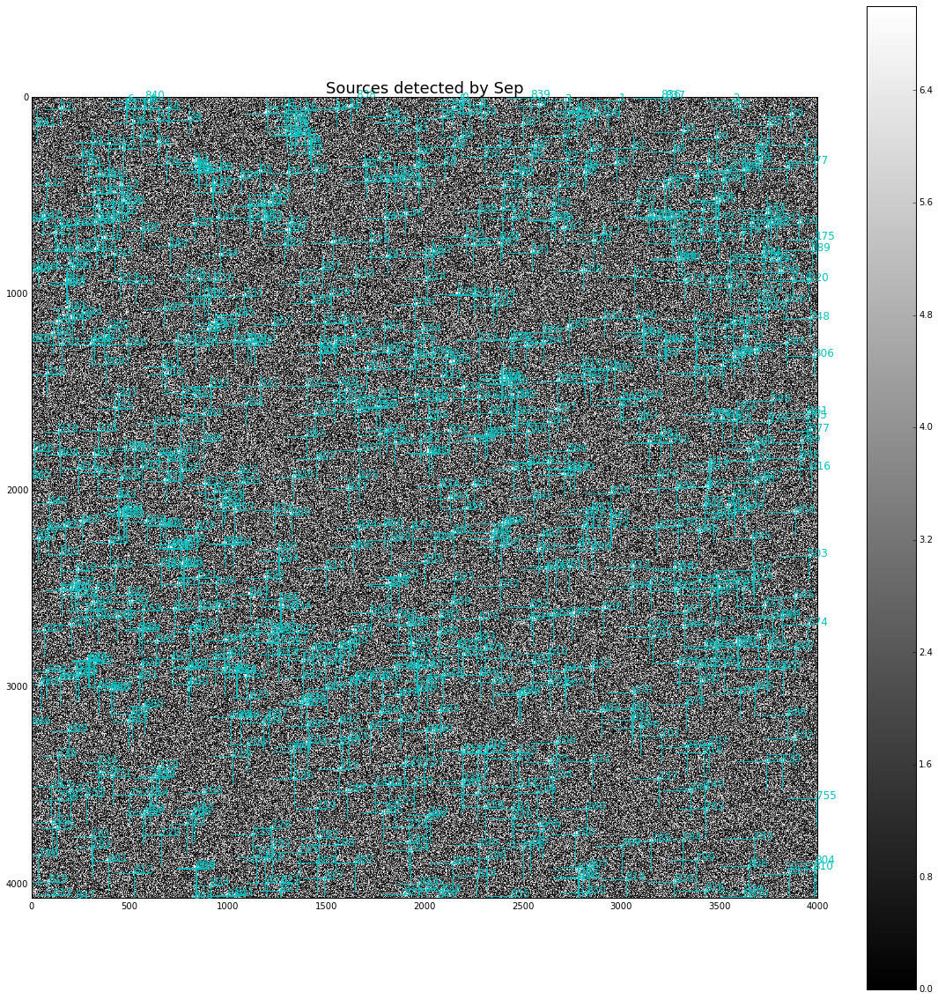

In [18]:
x_max = shape_data[0]
y_max = shape_data[1]

fig = figure(figsize=(20,20))
imshow(data, cmap='gray',vmin=0,vmax=7)
title("Sources detected by Sep", fontsize=18)
colorbar()

for i in range(len(objects)):
    x = objects_x[i]
    y = objects_y[i]
    
    porc_x = x/float(x_max)
    porc_y = 1-y/float(y_max)
    
    axvline(x,porc_y-0.02,porc_y+0.02,c='c')
    axhline(y,porc_x-0.02,porc_x+0.02,c='c') 
    text(x+1,y+1,str(i),color='c',fontsize=12)
    

## Sources from the simulation

We will now proceed to extract the source's information from the tables in the simulation data. This data is located in the folder src (sources) of the simulation.

In [21]:
path_images = '../../PruebaImagenes/w13_diffim_v11/src/v6866601-fi/R22/S20.fits'

We open the file and list its information. 

In [24]:
pha_list_src = fits.open(path_images)
pha_list_src.info()

Filename: ../../PruebaImagenes/w13_diffim_v11/src/v6866601-fi/R22/S20.fits
No.    Name         Type      Cards   Dimensions   Format
0    PRIMARY     PrimaryHDU       6   ()              
1                BinTableHDU    426   817R x 56C   [59X, 1K, 1D, 1D, 1K, 1D, 1D, 1D, 1D, 1D, 1D, 1E, 1E, 1D, 1D, 1D, 1E, 1E, 1E, 1D, 1D, 1D, 1D, 1E, 1E, 1E, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1J]   
2                BinTableHDU     40   1634R x 7C   [1J, 1J, 1J, 1J, 1J, 64A, 64A]   
3                BinTableHDU    843   18052R x 3C   [1J, 1J, 1J]   
4                BinTableHDU    857   880R x 6C    [1K, 1E, 1E, 1J, 1J, 1E]   


The main table is the first BinTableHDU. We can observe that it has way columns than the others.

In [25]:
pha_data_src=pha_list_src[1].data
#Columns
print pha_list_src[1].columns

ColDefs(
    name = 'flags'; format = '59X'
    name = 'id'; format = '1K'
    name = 'coord_ra'; format = '1D'
    name = 'coord_dec'; format = '1D'
    name = 'parent'; format = '1K'
    name = 'base_GaussianCentroid_x'; format = '1D'; unit = 'pixels'
    name = 'base_GaussianCentroid_y'; format = '1D'; unit = 'pixels'
    name = 'base_NaiveCentroid_x'; format = '1D'; unit = 'pixels'
    name = 'base_NaiveCentroid_y'; format = '1D'; unit = 'pixels'
    name = 'base_SdssCentroid_x'; format = '1D'; unit = 'pixels'
    name = 'base_SdssCentroid_y'; format = '1D'; unit = 'pixels'
    name = 'base_SdssCentroid_xSigma'; format = '1E'; unit = 'pixels'
    name = 'base_SdssCentroid_ySigma'; format = '1E'; unit = 'pixels'
    name = 'base_SdssShape_xx'; format = '1D'; unit = 'pixels^2'
    name = 'base_SdssShape_yy'; format = '1D'; unit = 'pixels^2'
    name = 'base_SdssShape_xy'; format = '1D'; unit = 'pixels^2'
    name = 'base_SdssShape_xxSigma'; format = '1E'; unit = 'pixels^2'
    name =

We can observe that we have a lot of information about the sources at hand. But, as this is a quick comparation we will just compare the coordinates of the sources. We will then just extract the information from <i>base_GaussianCentroid_x</i> and <i>base_GaussianCentroid_y</i>.

In [26]:
x_src=pha_data_src['base_GaussianCentroid_x']
y_src=pha_data_src['base_GaussianCentroid_y']
print len(x_src), len(y_src), min(x_src),max(x_src),min(y_src), max(y_src)

817 817 -1.43269867476 3995.65562937 -0.0948387476165 4069.67922387


There are 817 sources registered. We can now proceed to observe them in the image.

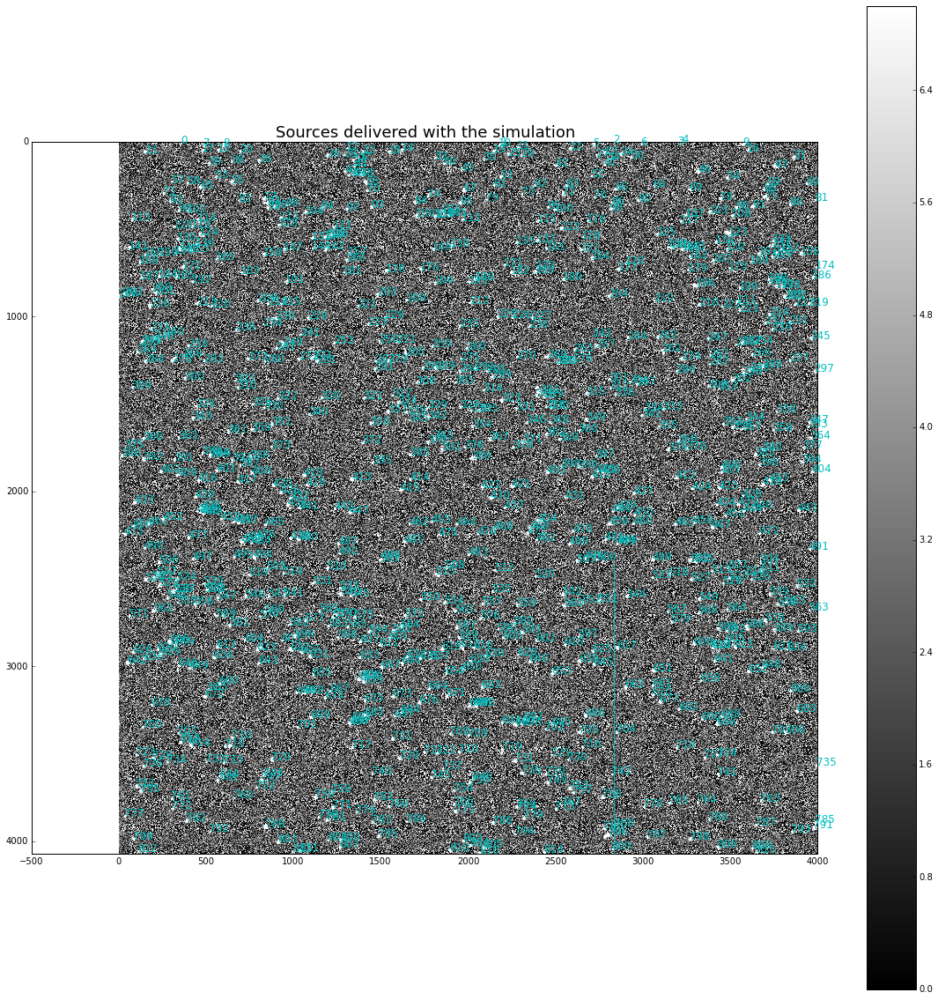

In [27]:
fig_1 = figure(figsize=(20,20))
imshow(data, cmap='gray',vmin=0,vmax=7)
colorbar()
title("Sources delivered with the simulation", fontsize=18)

for i in range(len(x_src)):
    x_f = x_src[i]
    y_f = y_src[i]

    axvline(x_f,y_f-0.5,y_f+0.5,c='c')
    axhline(y_f,x_f-0.5,x_f+0.5,c='c') 
    text(x_f+1,y_f+1,str(i),color='c',fontsize=12)
    


# Comparing the sources from both Sep and the Simulation Data. 

## Common sources

First we define a threshold. If both sources are within $ \pm $ this distance in any of the axis then they are considered to be the same source. This value has been chosen arbitrarly so far, it is expect to change.

In [28]:
comparation_threshold=50.0 

We will now go over all the sources detected by sep and compare each of them with all the sources from the simulation until a match is found.

In [30]:
common_sources_x=[]
common_sources_y=[]
distinct_sources_sep_x=[]
distinct_sources_sep_y=[]
x_src_copy=x_src.copy()
y_src_copy=y_src.copy()
print "Shape simulation", len(x_src_copy), len(y_src_copy)
print "Shape sep", len(objects_x), len(objects_y)
for i in range(len(objects)):
    sep_x,sep_y=objects_x[i],objects_y[i]
    match=0
    for j in range(len(x_src_copy)):
        sim_x,sim_y=x_src_copy[j],y_src_copy[j]
        #Now it compares
        if((abs(sim_x-sep_x)<=comparation_threshold)and(abs(sim_y-sep_y)<=comparation_threshold)):
            #Uncomment if needed to observe the coordinates for each source.
            #print "mismo_objeto"
            #print sim_x,sep_x
            #print sim_y,sep_y
            common_sources_x.append((sim_x + sep_x)/2.0)
            common_sources_y.append((sim_y + sep_y)/2.0)
            x_copy=delete(x_src_copy,j)
            y_copy=delete(y_src_copy,j)
            x_src_copy=x_copy
            y_src_copy=y_copy
            match=1
            break
    #Didnt find any match
    if(match==0):
        distinct_sources_sep_x.append(sep_x)
        distinct_sources_sep_y.append(sep_y)
num_common_objects= len(common_sources_x)
print "Shape distinct simulation", len(x_src_copy), len(y_src_copy)
print "Shape distinct sep", len(distinct_sources_sep_x), len(distinct_sources_sep_y)
print "Shape common", len(common_sources_x), len(common_sources_y)

Shape simulation 817 817
Shape sep 851 851
Shape distinct simulation 19 19
Shape distinct sep 53 53
Shape common 798 798


<p>We can observe that the number of sources differ between sep and the simulation data. Nevertheless, the number of common sources is considerably larger than the number of distinct ones (718 vs 71, almost 10 to 1). </p>
<p>We now proceed to visualize the common sources in the image</p>

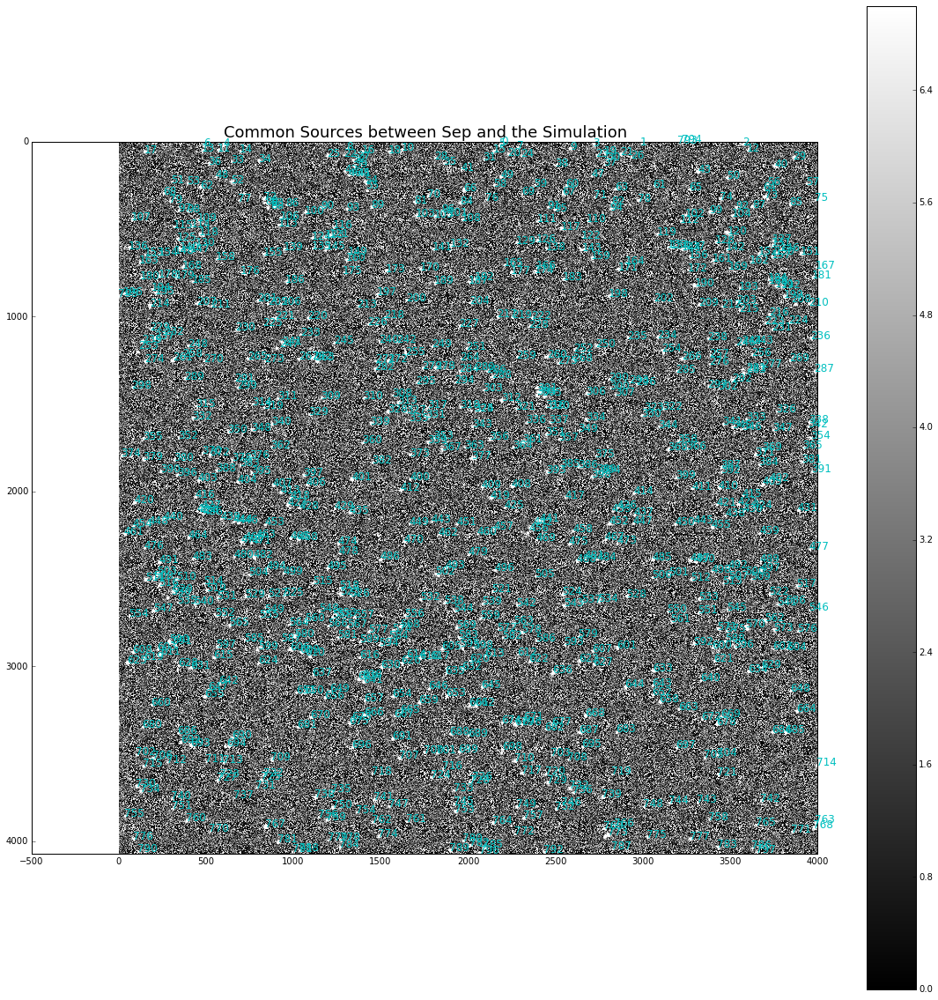

In [32]:
fig_2 = figure(figsize=(20,20))
imshow(data, cmap='gray',vmin=0,vmax=7)
title("Common Sources between Sep and the Simulation", fontsize=18)
colorbar()

for i in range(len(common_sources_x)):
    x_f = common_sources_x[i]
    y_f = common_sources_y[i]

    axvline(x_f,y_f-0.5,y_f+0.5,c='c')
    axhline(y_f,x_f-0.5,x_f+0.5,c='c') 
    text(x_f+1,y_f+1,str(i),color='c',fontsize=12)
    

<p>The image seems clearer than before. But as there are so many sources (~800) it's difficult to draw conclusions from simple observation.</p>
<p>We will now proceed to draw the curves of intensity over the sources.</p>

#Curves over the common sources

<p>To get the profiles of intensity of the sources we "draw" a line horizontaly centered in the source and get the intensity of each pixel in that line. </p>
<p>We show the 20 first curves here in the notebook. The rest is stored in the folder<i>curves_over_sources</i></p>

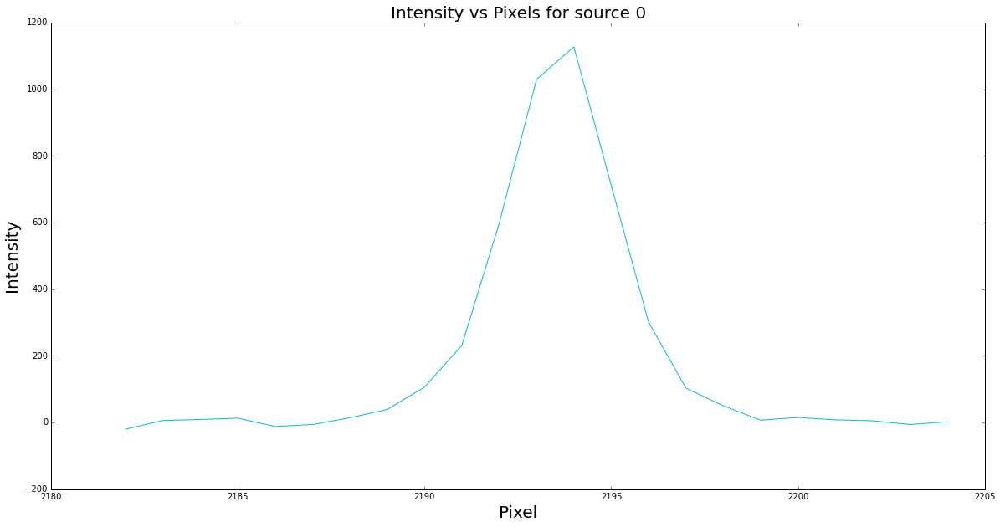

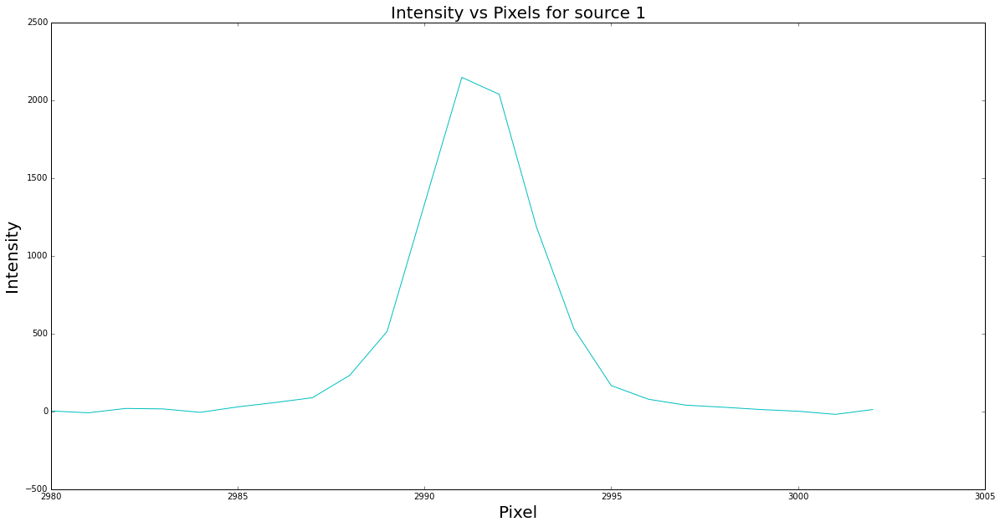

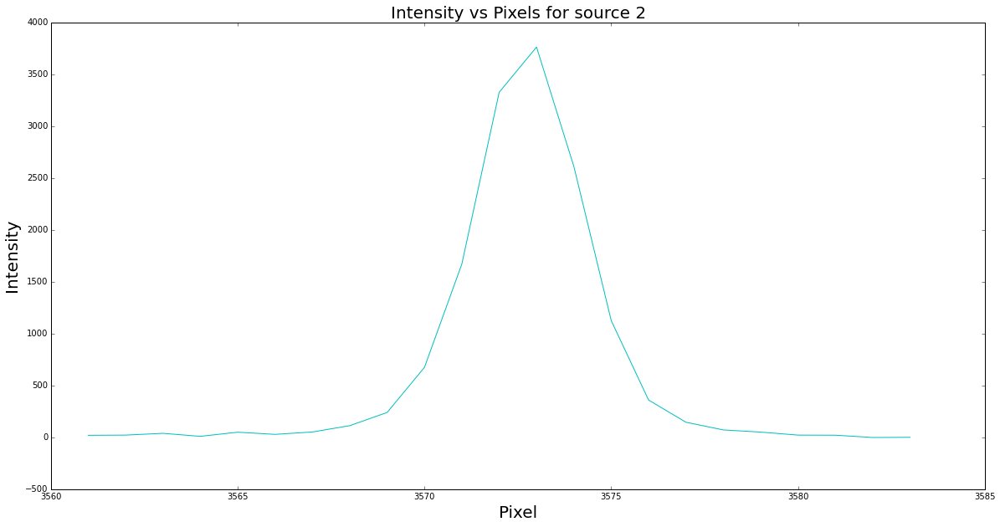

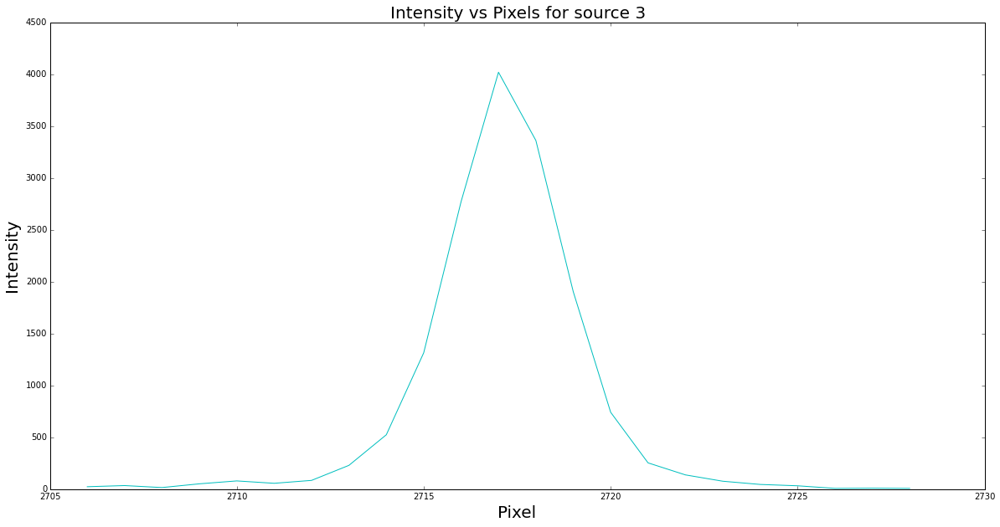

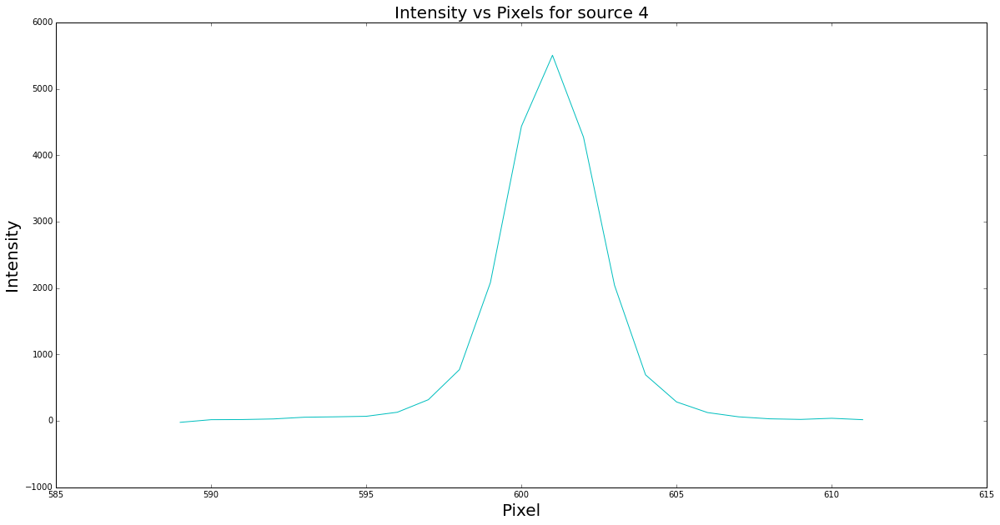

...

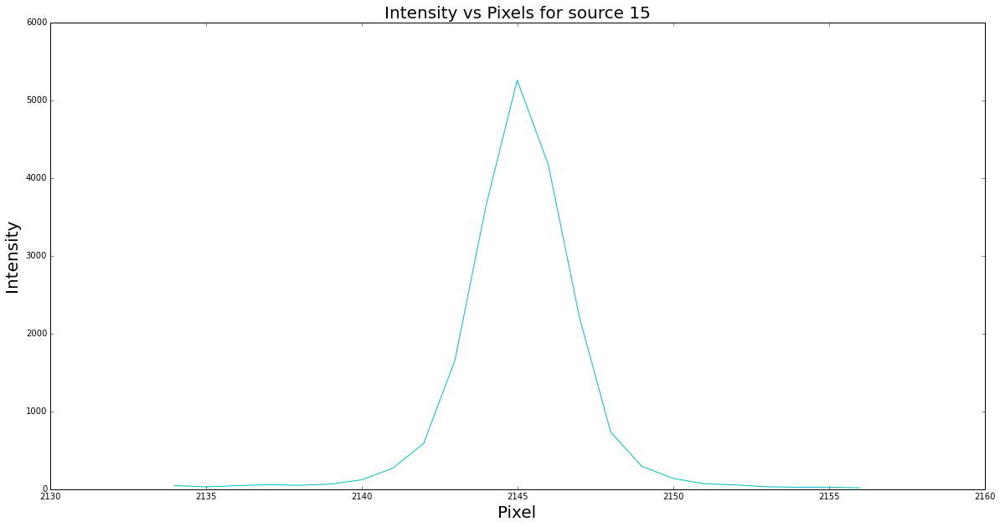

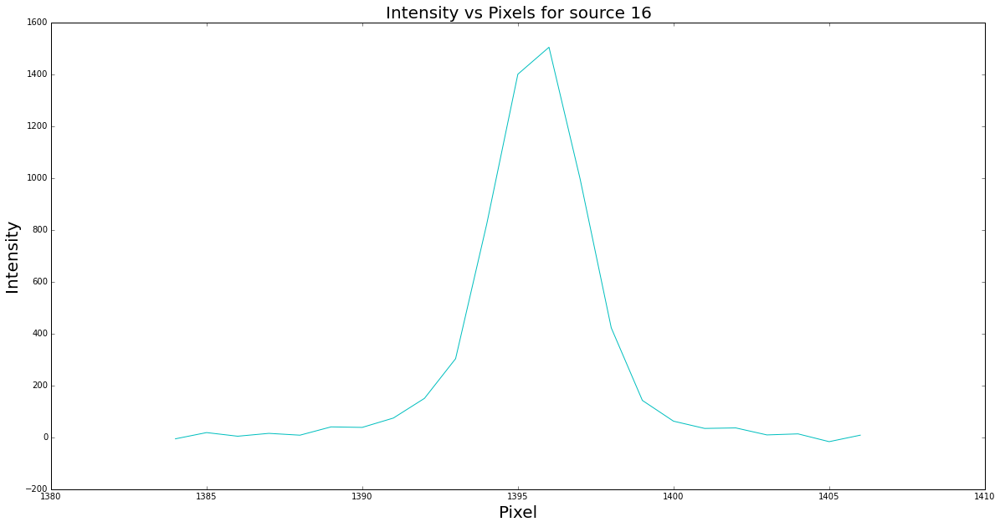

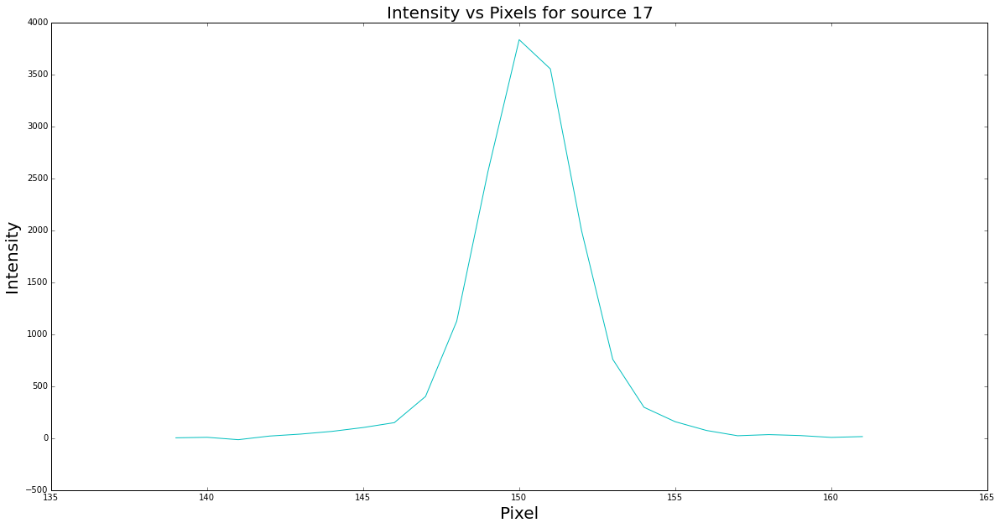

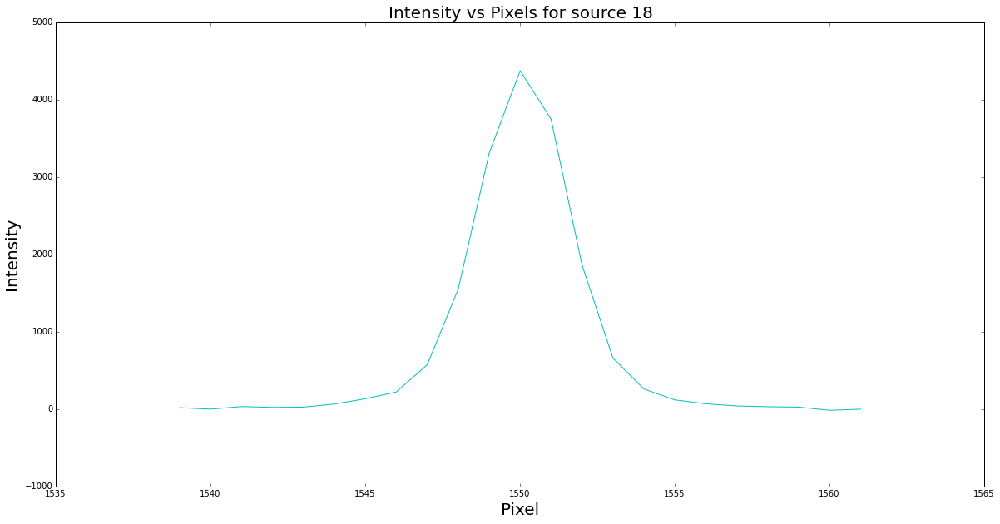

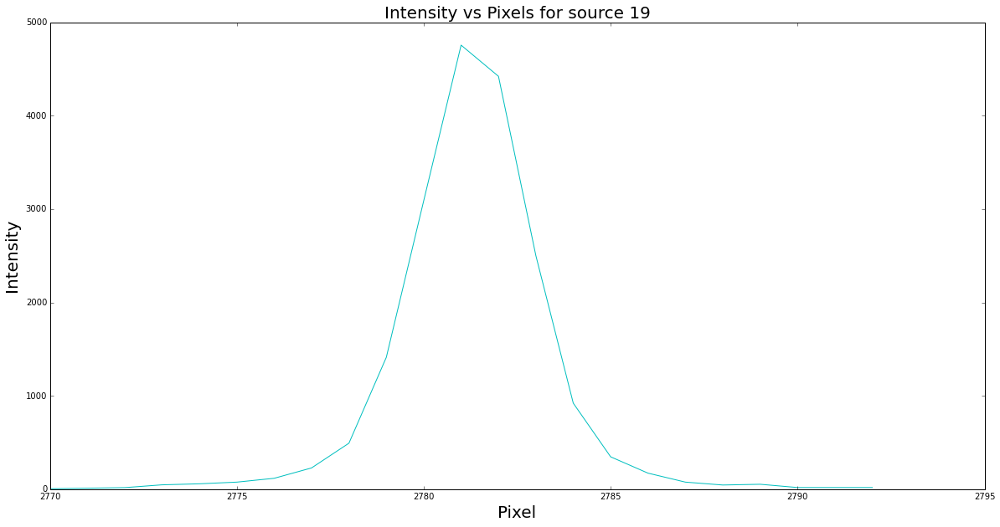

In [36]:
common_objects_x_int = array([int(ox) for ox in common_sources_x])
common_objects_y_int = array([int(oy) for oy in common_sources_y])
for i in range(num_common_objects):

    row = common_objects_x_int[i]
    column = common_objects_y_int[i]
    
    array_pixels = zeros(23)
    array_intensity = zeros(23)
    index_arrays = 0
    
    if (row-12 < 0):
        for lin in range(0,row+11+1):
            pixel = data[lin][column]
            array_pixels[index_arrays] = lin
            array_intensity[index_arrays] = pixel
            index_arrays += 1
            
    elif (row+12 > shape_data[1]):
        for lin in range(row-11,shape_data[1]):
            pixel = data[lin][column]
            array_pixels[index_arrays] = lin
            array_intensity[index_arrays] = pixel
            index_arrays += 1

    else:
        for lin in range(row-11,row+11+1):
            try:
                pixel = data[column][lin]
                array_pixels[index_arrays] = lin
                array_intensity[index_arrays] = pixel
                index_arrays += 1
            except Exception:
                print shape(data), shape(array_pixels), shape(array_intensity)
                print lin, column, row, index_arrays
    
    if(i <20):
        fig = figure(figsize=(20,10))
        plot(array_pixels,array_intensity,c='c')
        xlabel('Pixel',fontsize=20)
        ylabel('Intensity',fontsize=20)
        title('Intensity vs Pixels for source '+str(i),fontsize=20)
        plt.savefig('./curves_over_sources/'+'S20/'+str(i)+'.png')
    else:
        fig = figure(figsize=(20,10))
        plot(array_pixels,array_intensity,c='c')
        xlabel('Pixel',fontsize=20)
        ylabel('Intensity',fontsize=20)
        title('Intensity vs Pixels for source '+str(i),fontsize=20)
        plt.savefig('./curves_over_sources/'+'S20/'+str(i)+'.png')
        close()

<p>We can observe that for almost all the curves observable here, the curve is a Gaussian, as you would expect from a source.</p>
<p>Nevertheless, some of the curves generated aren't gaussians. The others seem to be several sources very close together.</p> 

<p>Here we can observe two examples of thoses curves</p>
<img src="./curves_over_sources/S20/55.png">
<p>This one, the 55, seem to have quite a few sources squished together into one</p>
<img src="./curves_over_sources/S20/143.png">
<p>On this curve we can clearly differenciate two different sources which were identified as one. The error involved may be the methods used or the way the threshold used in the comparation.</p>

### Conclusions

We can clearly see that the two methods seem equally good as the curves of the common sources between the two methods show good results (most are Gaussinas). Nevertheless there is still a lot of information to explore but this is quite a start.